<a id="section-one"></a>
# Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import glob
import math
import random
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path 
import torch

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
df_submission = pd.read_csv('/kaggle/input/stable-diffusion-image-to-prompts/sample_submission.csv', index_col='imgId_eId')
df_submission.head()

,val
imgId_eId,
20057f34d_0,0.018848
20057f34d_1,0.030190
20057f34d_2,0.072792
20057f34d_3,-0.000673
20057f34d_4,0.016774


<a id="s2"></a>
# EDA

In [3]:
prompts_df = pd.read_csv("../input/stable-diffusion-image-to-prompts/prompts.csv")
prompts_df

,imgId,prompt
0,20057f34d,hyper realistic photo of very friendly and dys...
1,227ef0887,"ramen carved out of fractal rose ebony, in the..."
2,92e911621,ultrasaurus holding a black bean taco in the w...
3,a4e1c55a9,a thundering retro robot crane inks on parchme...
4,c98f79f71,"portrait painting of a shimmering greek hero, ..."
5,d8edf2e40,an astronaut standing on a engaging white rose...
6,f27825b2c,Kaggle employee Phil at a donut shop ordering ...


In [4]:
prompts_df.shape

(7, 2)

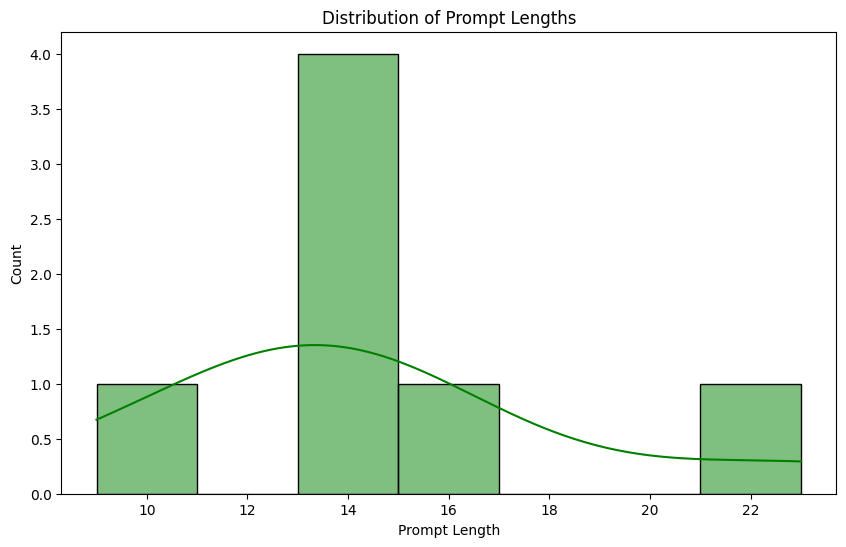

In [5]:
# Get the length of each prompt
prompt_lengths = prompts_df["prompt"].apply(lambda x: len(x.split()))

# Plot the distribution of prompt lengths
plt.figure(figsize=(10, 6))
sns.histplot(prompt_lengths, kde=True, color="green")
plt.title("Distribution of Prompt Lengths")
plt.xlabel("Prompt Length")
plt.show()

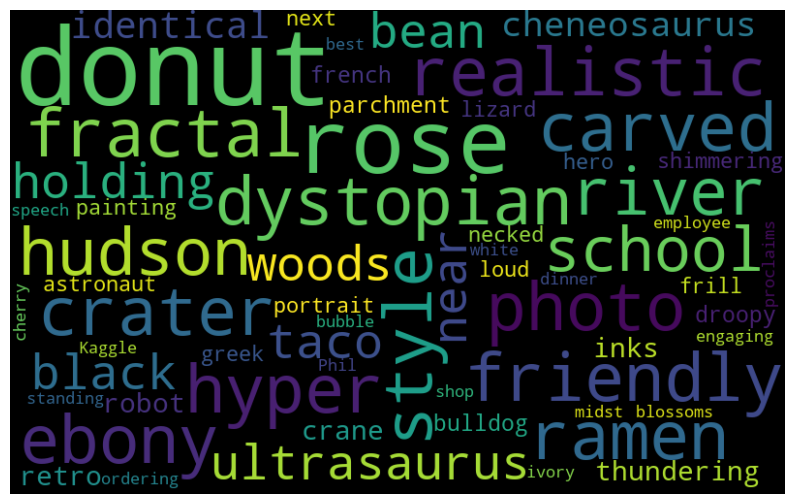

In [6]:
from wordcloud import WordCloud

# Join all the prompts together into a single string
text = " ".join(prompt for prompt in prompts_df.prompt)

# Generate a word cloud
wordcloud = WordCloud(width=800, height=500, random_state=42, max_font_size=110).generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [7]:
def image_id2path(
    img_id: str, 
    folder: str = "stable-diffusion-image-to-prompts"
) -> str:
    return f"../input/{folder}/images/{img_id}.png"

In [8]:
df_prompts = prompts_df.copy

**Function to show images and prompts provided,** we will be using this quite often

In [9]:
def show_images_and_prompts(
    df: pd.DataFrame, 
    folder: str = "stable-diffusion-image-to-prompts",
    n: int = 10,
) -> None:
    if n == -1:
        n = df.shape[0]
    for ind, row in df[:n].iterrows():
        img_id = row["imgId"]
        prompt = row["prompt"]
        path = image_id2path(img_id, folder)
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        if ind % 2 == 0:
            plt.figure(figsize=(16, 8))
            plt.subplot(1, 2, 1)
        else:
            plt.subplot(1, 2, 2)
            
        plt.imshow(image)
        list_prompt_words = prompt.split()
        if len(prompt) > 100:
            _len = len(list_prompt_words)
            prompt = "{}\n{}\n{}".format(
                " ".join(list_prompt_words[:_len // 3]),
                " ".join(list_prompt_words[_len // 3 : 2 * _len // 3]),
                " ".join(list_prompt_words[2 * _len // 3:]),
            )
        elif len(prompt) > 50:
            _len = len(list_prompt_words)
            prompt = "{}\n{}".format(
                " ".join(list_prompt_words[:_len // 2]),
                " ".join(list_prompt_words[_len // 2:])
            )
        plt.title(prompt, fontsize=14)
        plt.axis("off")

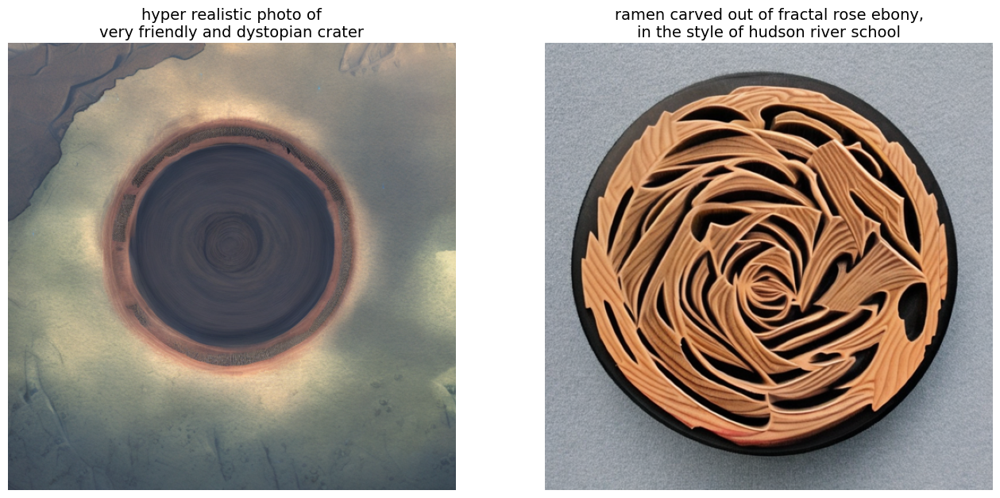

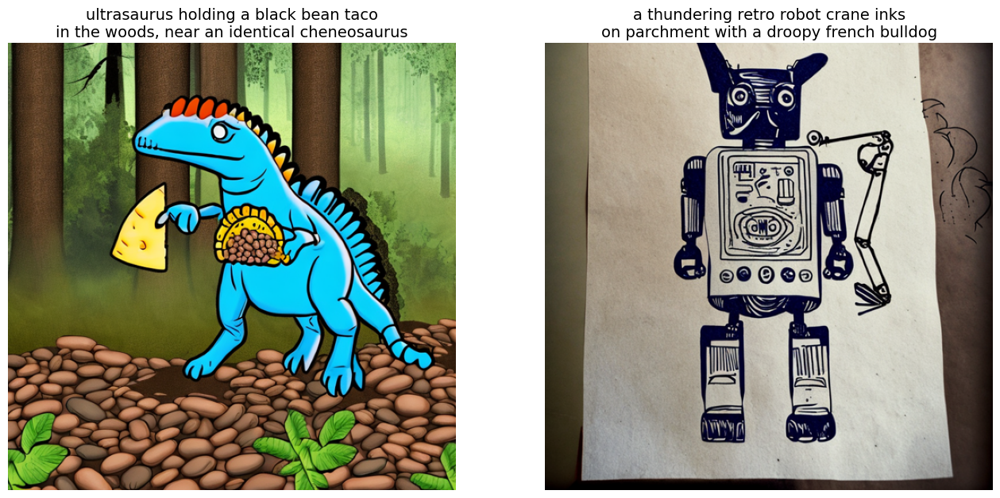

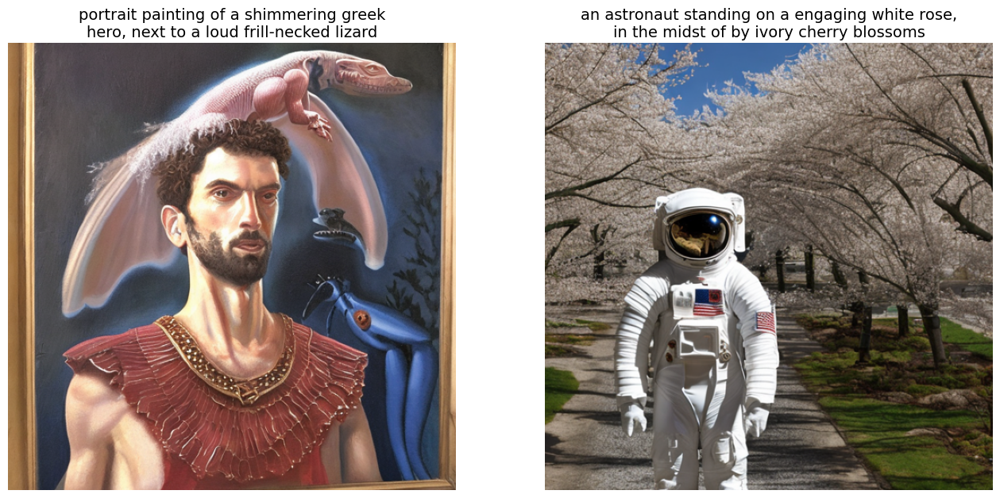

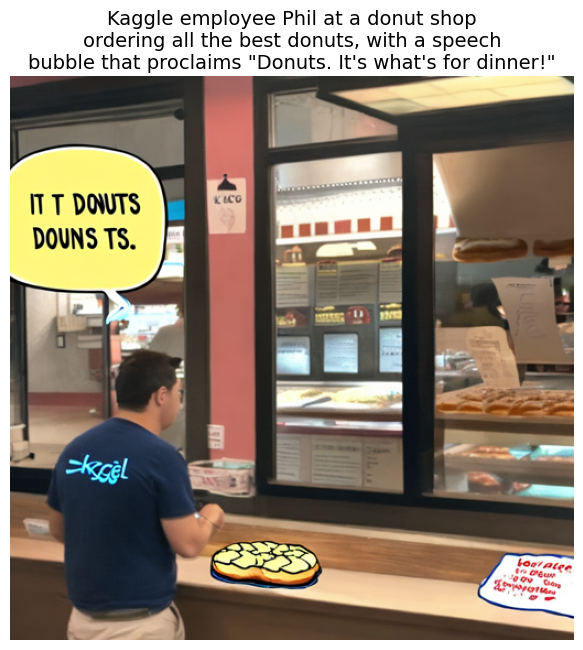

In [10]:
if df_prompts is not None:
    show_images_and_prompts(prompts_df, n=7)

<a id="s3"></a>

# Dataset Used

I have used a custom dataset in this notebook which can be found here: https://www.kaggle.com/datasets/ihelon/prompt2image

In [11]:
df_own = pd.read_csv("../input/prompt2image/prompts.csv", dtype={"imgId": "object"})
df_own

,imgId,prompt
0,000001,hyper realistic photo of very friendly and dys...
1,000002,"ramen carved out of fractal rose ebony, in the..."
2,000003,ultrasaurus holding a black bean taco in the w...
3,000004,a thundering retro robot crane inks on parchme...
4,000005,"portrait painting of a shimmering greek hero, ..."
5,000006,an astronaut standing on a engaging white rose...
6,000007,Kaggle employee Phil at a donut shop ordering ...
7,000008,shop with wooden shoes
8,000009,"Flamingo wearing a tutu and ballet slippers, d..."
9,000010,A still life painting of a vase of flowers wit...


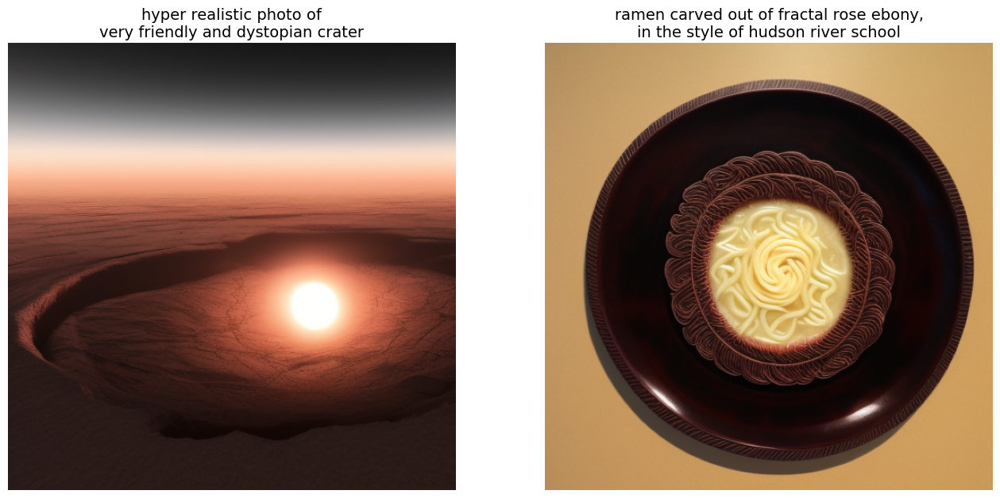

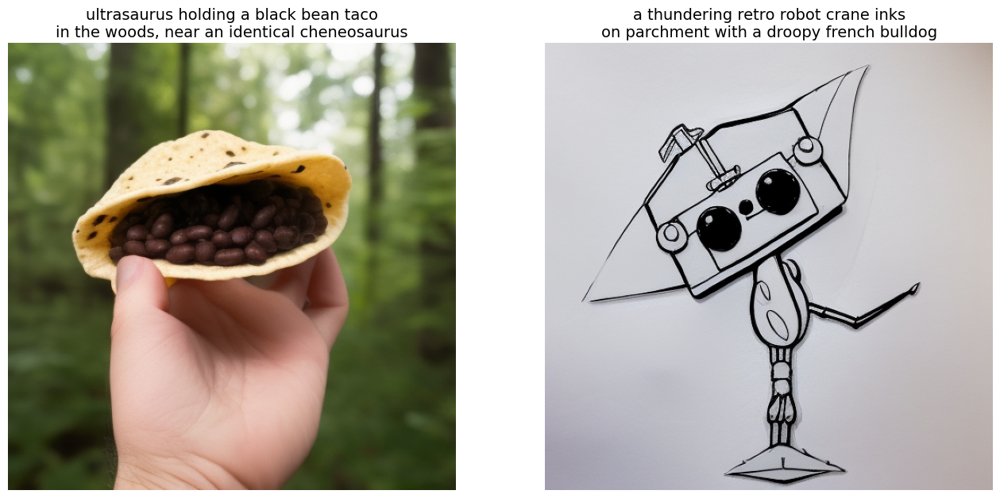

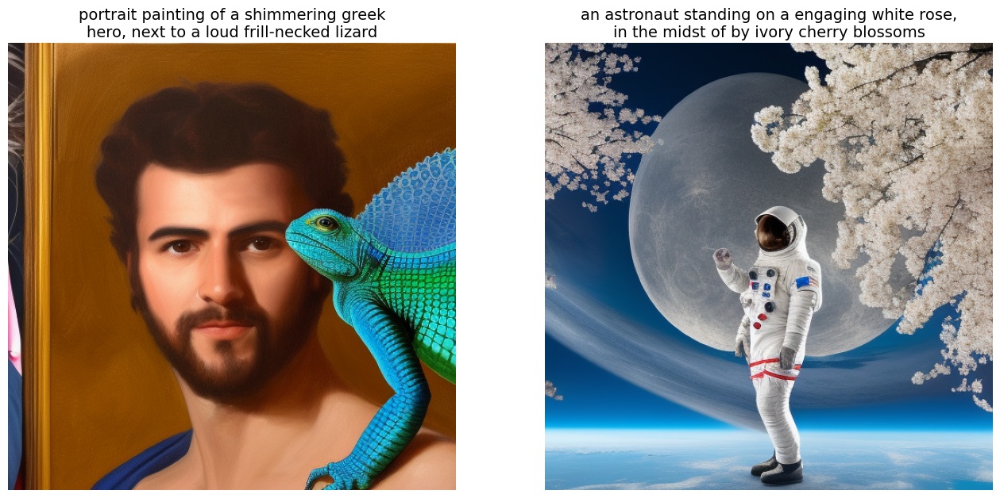

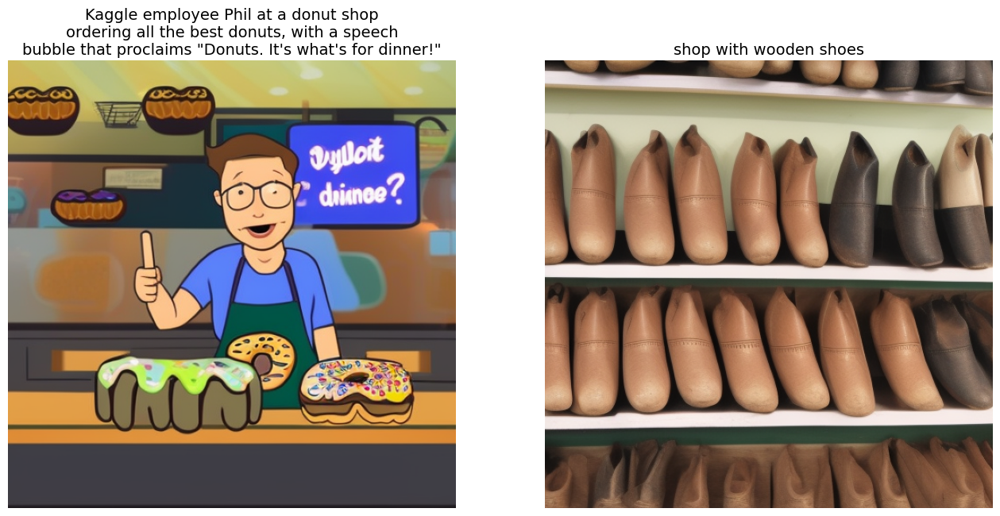

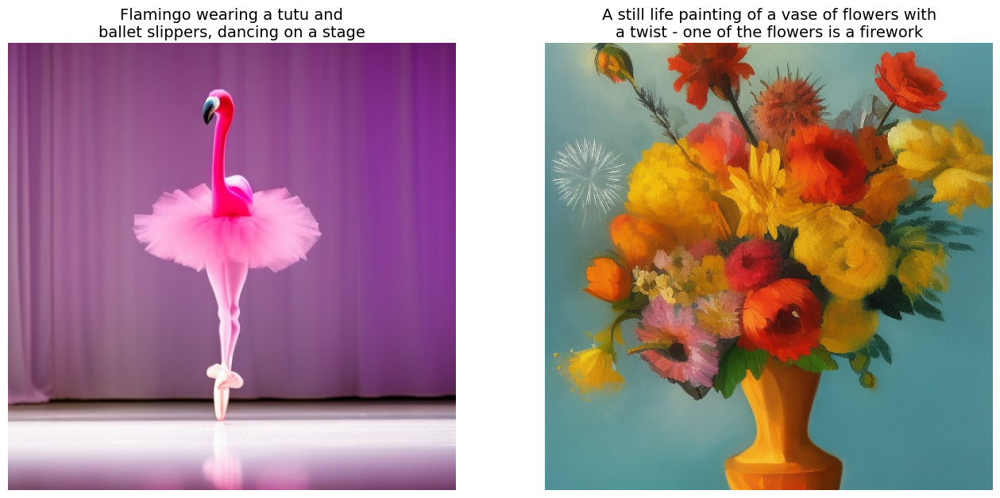

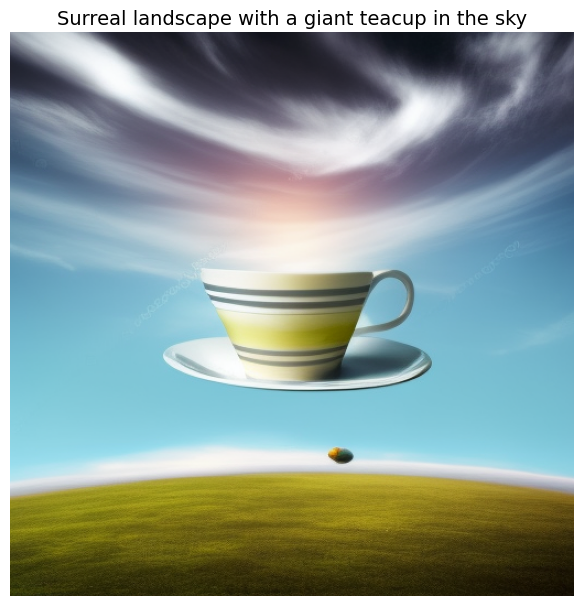

In [12]:
show_images_and_prompts(
    df=df_own,
    folder="prompt2image",
    n=-1,
)

<a id="s4"></a>
# Import All Dependencies

In [13]:
df_own = pd.read_csv("../input/prompt2image/prompts.csv", dtype={"imgId": "object"})
df_own

,imgId,prompt
0,000001,hyper realistic photo of very friendly and dys...
1,000002,"ramen carved out of fractal rose ebony, in the..."
2,000003,ultrasaurus holding a black bean taco in the w...
3,000004,a thundering retro robot crane inks on parchme...
4,000005,"portrait painting of a shimmering greek hero, ..."
5,000006,an astronaut standing on a engaging white rose...
6,000007,Kaggle employee Phil at a donut shop ordering ...
7,000008,shop with wooden shoes
8,000009,"Flamingo wearing a tutu and ballet slippers, d..."
9,000010,A still life painting of a vase of flowers wit...


In [34]:
# For later use
ratio_ViT_B_16          = 0.30
ratio_CLIP_Interrogator = 0.11
ratio_OFA               = 0.09

CKPT_DIR = "/kaggle/input/stable-diffusion-data/OFA-large-caption/"
IMAGE_DIR = "/kaggle/input/stable-diffusion-image-to-prompts/images"

BATCH_SIZE = 24

In [35]:
wheels_path = "/kaggle/input/open-clip-wheels/open_clip_wheels"
open_clip_whl_path = f"{wheels_path}/open_clip_torch-2.14.0-py3-none-any.whl"

!pip install --no-index --find-links $wheels_path $open_clip_whl_path -q

In [36]:
import open_clip

In [37]:
sys.path.append('../input/sentence-transformers-222/sentence-transformers')
from sentence_transformers import SentenceTransformer, models

In [38]:
comp_path = Path('/kaggle/input/stable-diffusion-image-to-prompts/')

<a id="s5"></a>
# Define Configurations

In [39]:
class CFG:
    device = "cuda"
    seed = 42
    embedding_length = 384
    sentence_model_path = "/kaggle/input/sentence-transformers-222/all-MiniLM-L6-v2"
    model_name = "coca_ViT-L-14"
    model_checkpoint_path = "/kaggle/input/open-clip-models/mscoco_finetuned_CoCa-ViT-L-14-laion2B-s13B-b90k.bin"

Build index from images and compare to sample submission index

In [40]:
images = os.listdir(comp_path / 'images')
imgIds = [i.split('.')[0] for i in images]

eIds = list(range(CFG.embedding_length))

imgId_eId = [
    '_'.join(map(str, i)) for i in zip(
        np.repeat(imgIds, CFG.embedding_length),
        np.tile(range(CFG.embedding_length), len(imgIds)))]

assert sorted(imgId_eId) == sorted(df_submission.index)

# Load the embedding model

In [41]:
st_model = SentenceTransformer(CFG.sentence_model_path)

<a id="s6"></a>
# Define imt2text CoCa OpenCLIP model

In [42]:
model = open_clip.create_model(CFG.model_name)
open_clip.load_checkpoint(model, CFG.model_checkpoint_path)

<All keys matched successfully>

In [43]:
transform = open_clip.image_transform(
    model.visual.image_size,
    is_train = False,
    mean = getattr(model.visual, 'image_mean', None),
    std = getattr(model.visual, 'image_std', None),
)

In [44]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print(device)

cpu


<a id="s7"></a>
# Extract promt from images

In [45]:
prompts = []

images_path = "../input/stable-diffusion-image-to-prompts/images/"
for image_name in images:
    img = Image.open(images_path + image_name).convert("RGB")
    img = transform(img).unsqueeze(0)

    with torch.no_grad(), torch.cuda.amp.autocast():
        generated = model.generate(img.to(device))
    
    prompts.append(
        open_clip.decode(
            generated[0]
        ).split("<end_of_text>")[0].replace("<start_of_text>", "").rstrip(" .,")
    )

# Encode prompts for submisssion
prompt_embeddings = st_model.encode(prompts).flatten()

/opt/conda/lib/python3.10/site-packages/torch/amp/autocast_mode.py:204: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn('User provided device_type of \'cuda\', but CUDA is not available. Disabling')


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

<a id="s8"></a>
# Evaluation

In [46]:
prompts

['a man standing in front of a counter with a cake',
 'an illustration of a dinosaur eating a piece of cheese',
 'a drawing of a robot holding a remote control',
 'an aerial view of a hole in the ground',
 'a person in a spacesuit walking down a road',
 'a round wooden bowl with a design on it',
 'a painting of a man with a bird on his head']

In [47]:
prompts[0]

'a man standing in front of a counter with a cake'

In [48]:
prompts_df['prompt']

for i in range(len(prompts_df)):
    prompts_df['prompt'][i] = prompts[i]

In [49]:
dff = prompts_df.copy()

Reodering list for correct visualisation

In [50]:
dff.loc[0]['prompt'] = prompts_df['prompt'][3]
dff.loc[1]['prompt'] = prompts_df['prompt'][5]
dff.loc[2]['prompt'] = prompts_df['prompt'][1]
dff.loc[3]['prompt'] = prompts_df['prompt'][2]
dff.loc[4]['prompt'] = prompts_df['prompt'][6]
dff.loc[5]['prompt'] = prompts_df['prompt'][4]
dff.loc[6]['prompt'] = prompts_df['prompt'][0]

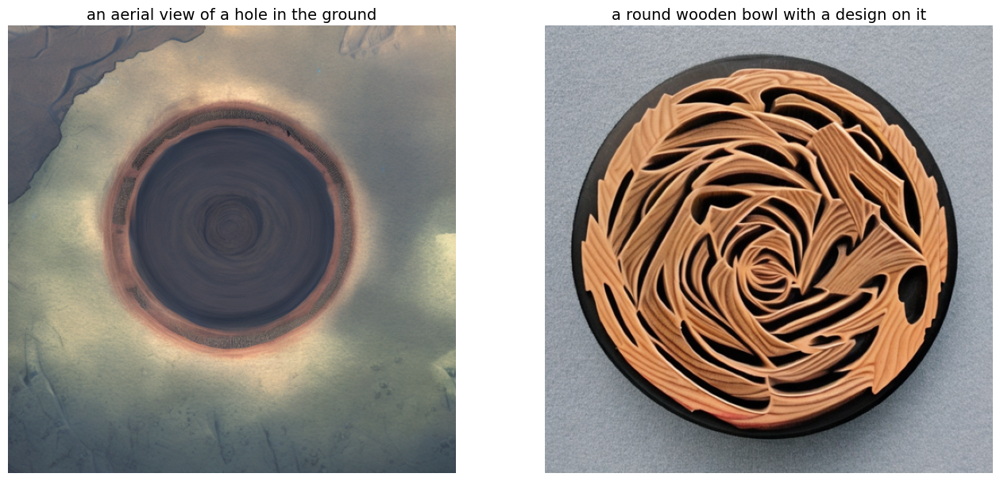

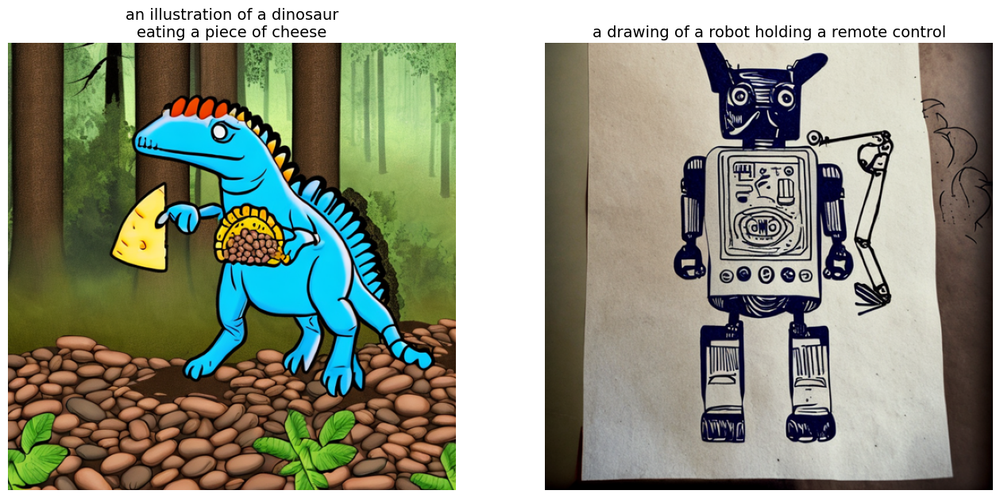

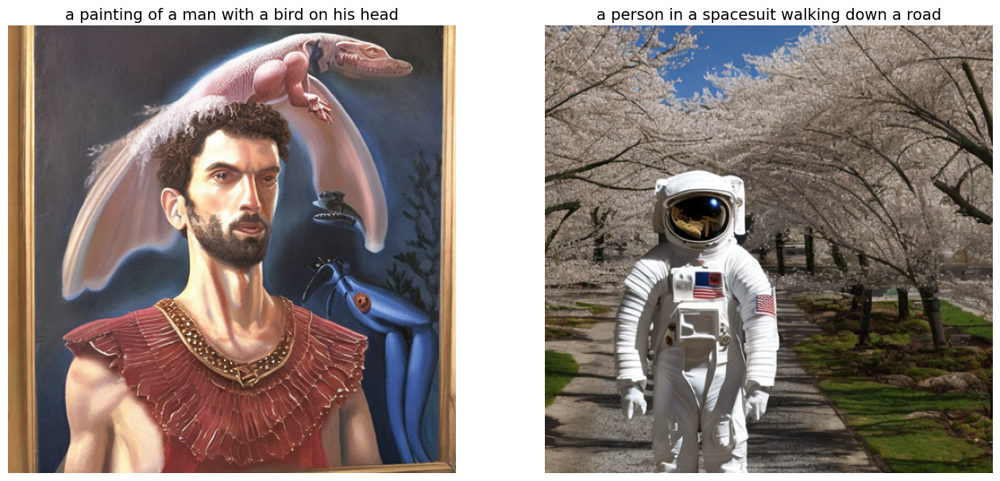

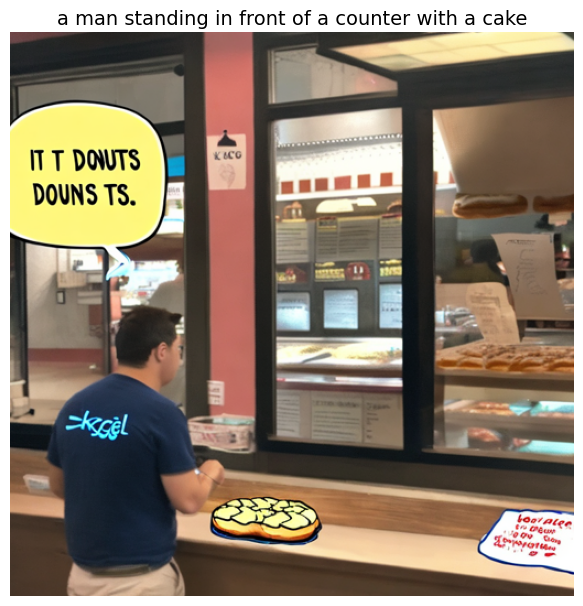

In [51]:
if df_prompts is not None:
    show_images_and_prompts(dff, n=7)

As we can see, our model has performed very well in analysing and describing the context of the picture! We will proceed to make a submission now

<a id="s9"></a>
# Submission

In [52]:
submission = pd.DataFrame(
    index=imgId_eId,
    data=prompt_embeddings,
    columns=['val']
).rename_axis('imgId_eId').reset_index()

submission

,imgId_eId,val
0,f27825b2c_0,0.029225
1,f27825b2c_1,0.053408
2,f27825b2c_2,-0.084613
3,f27825b2c_3,0.017963
4,f27825b2c_4,-0.075529
...,...,...
2683,c98f79f71_379,-0.073868
2684,c98f79f71_380,0.012851
2685,c98f79f71_381,0.028804
2686,c98f79f71_382,0.009998


In [53]:
submission.to_csv('submission.csv', index=False)

Reference notebooks:
 
* https://www.kaggle.com/code/sajit08/stablediffusion-v2
* https://www.kaggle.com/competitions/stable-diffusion-image-to-prompts
* https://www.kaggle.com/code/maverickss26/lb-0-55962-clipinterrogator-ofa-vit/notebook
* https://www.kaggle.com/code/ihelon/image2prompts-eda-ensembling/notebook
* https://www.kaggle.com/code/leonidkulyk/lb-0-42118-laion-s-coca-vit-openclip
*https://www.kaggle.com/code/inversion/calculating-stable-diffusion-prompt-embeddings/notebook